<a href="https://colab.research.google.com/github/AlessioPeluso/Gender-Recognition-by-Voice/blob/master/voice_gender.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Voice Gender

## Gender Recognition by Voice and Speech Analysis

> This database was created to identify a voice as male or female, based upon acoustic properties of the voice and speech. The dataset consists of 3,168 recorded voice samples, collected from male and female speakers. The voice samples are pre-processed by acoustic analysis in R using the seewave and tuneR packages, with an analyzed frequency range of 0hz-280hz (human vocal range).

from [this](https://www.kaggle.com/primaryobjects/voicegender) *kaggle* dataset.

---

I'm going to classify the genders using:
- **support vector machines**
- **random forest classifiers**

And visualize the data using **t-sne**.

---

Let's begin by loading the dataset 

In [12]:
import pandas as pd

voice = pd.read_csv('/voice.csv')
headers = voice.columns
X, y = voice[headers[:-1]], voice['label']
y = y.replace({'male':1,'female':0})

X.head()

,meanfreq,sd,median,Q25,Q75,IQR,skew,kurt,sp.ent,sfm,mode,centroid,meanfun,minfun,maxfun,meandom,mindom,maxdom,dfrange,modindx
0,0.059781,0.064241,0.032027,0.015071,0.090193,0.075122,12.863462,274.402906,0.893369,0.491918,0.000000,0.059781,0.084279,0.015702,0.275862,0.007812,0.007812,0.007812,0.000000,0.000000
1,0.066009,0.067310,0.040229,0.019414,0.092666,0.073252,22.423285,634.613855,0.892193,0.513724,0.000000,0.066009,0.107937,0.015826,0.250000,0.009014,0.007812,0.054688,0.046875,0.052632
2,0.077316,0.083829,0.036718,0.008701,0.131908,0.123207,30.757155,1024.927705,0.846389,0.478905,0.000000,0.077316,0.098706,0.015656,0.271186,0.007990,0.007812,0.015625,0.007812,0.046512
3,0.151228,0.072111,0.158011,0.096582,0.207955,0.111374,1.232831,4.177296,0.963322,0.727232,0.083878,0.151228,0.088965,0.017798,0.250000,0.201497,0.007812,0.562500,0.554688,0.247119
4,0.135120,0.079146,0.124656,0.078720,0.206045,0.127325,1.101174,4.333713,0.971955,0.783568,0.104261,0.135120,0.106398,0.016931,0.266667,0.712812,0.007812,5.484375,5.476562,0.208274


The dataset has 3168 records (1584 male - 1584 female) and 20 features:
- meanfreq: mean frequency (in kHz)
- sd: standard deviation of frequency
- median: median frequency (in kHz)
- Q25: first quantile (in kHz)
- Q75: third quantile (in kHz)
- IQR: interquantile range (in kHz)
- skew: skewness (see note in specprop description)
- kurt: kurtosis (see note in specprop description)
- sp.ent: spectral entropy
- sfm: spectral flatness
- mode: mode frequency
- centroid: frequency centroid (see specprop)
- peakf: peak frequency (frequency with highest energy)
- meanfun: average of fundamental frequency measured across acoustic signal
- minfun: minimum fundamental frequency measured across acoustic signal
- maxfun: maximum fundamental frequency measured across acoustic signal
- meandom: average of dominant frequency measured across acoustic signal
- mindom: minimum of dominant frequency measured across acoustic signal
- maxdom: maximum of dominant frequency measured across acoustic signal
- dfrange: range of dominant frequency measured across acoustic signal
- modindx: modulation index. Calculated as the accumulated absolute difference between adjacent measurements of fundamental  frequencies divided by the frequency range

---

### Data visualization

Fun first, let's visualize the dataset using *t-sne*


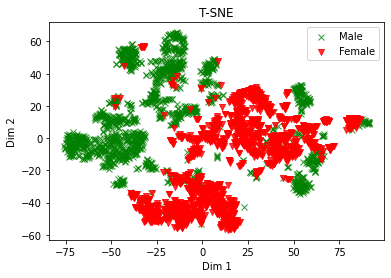

In [13]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
import numpy as np

# Rescale data before TSNE
X_scale = StandardScaler().fit_transform(X)

# Sklearn TSNE
tsne = TSNE(n_components=2, init='pca', random_state=0)
X_t = tsne.fit_transform(X_scale)

plt.figure()
plt.scatter(X_t[np.where(y == 0), 0],
                   X_t[np.where(y == 0), 1],
                   marker='x', color='g',
                   linewidth='1', alpha=0.8, label='Male')
plt.scatter(X_t[np.where(y == 1), 0],
                   X_t[np.where(y == 1), 1],
                   marker='v', color='r',
                   linewidth='1', alpha=0.8, label='Female')

plt.xlabel('Dim 1')
plt.ylabel('Dim 2')
plt.title('T-SNE')
plt.legend(loc='best')
plt.savefig('1.png')
plt.show()  

We can see that with t-sne we have a pretty good separation of the two genders, I'm positive on achieving a good result in the classification.

Now let's look at a pairplot.

In [15]:
import seaborn as sns
import matplotlib.pyplot as plt
 
# basic correlogram
sns.pairplot(voice, hue = 'label', height=5)
plt.show()

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


We can see that the mean_fun feature itself can clearly separate the two labels.

---

## Analysis

### Method #1 Support vector machine

Let's implement some *support vector machines* with different kernels (*linear,gaussian,polynomial*) and also tune the various hyperparameters such as *C ,gamma* and *degree* to find out the best performing one.

First thing to do is to scale the data to be between -1 and 1, this will not be necessary for the random forest, but helps the svm to acheive better results.

In [0]:
# scale the data
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(X)
X = scaler.transform(X)


Splitting dataset into *training set* and *testing set* for better generalization


In [0]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=1623)


1. SVM with default hyperparameter.

In [25]:
from sklearn.svm import SVC
from sklearn import metrics

svc=SVC() #Default hyperparameters
svc.fit(X_train,y_train)

y_pred=svc.predict(X_test)

from sklearn.model_selection import cross_val_score
scores = cross_val_score(svc, X, y, cv=10, scoring='accuracy') 

print('Accuracy Score:', scores.mean())

# Accuracy Score: 0.9665325639899376

0.9665325639899376


Just with the default parameter we acheive a very good accuracy.

2. Default Linear Kernel

In [26]:
svc=SVC(kernel='linear')
svc.fit(X_train,y_train)

y_pred=svc.predict(X_test)

scores = cross_val_score(svc, X, y, cv=10, scoring='accuracy') 

print('Accuracy Score:', scores.mean())

# Accuracy Score: 0.9696991175178692

Accuracy Score: 0.9696991175178692


As expected the accuracy is pretty close the one above and the method can discriminize the two genders.

3. Default Guassian Kernel

In [27]:
svc=SVC(kernel='rbf')
svc.fit(X_train,y_train)

y_pred=svc.predict(X_test)

scores = cross_val_score(svc, X, y, cv=10, scoring='accuracy') 

print('Accuracy Score:', scores.mean())

# Accuracy Score: 0.9665325639899376

Accuracy Score: 0.9665325639899376


The last one is the:

4. Default Polynomial Kernel

In [28]:
svc=SVC(kernel='poly')
svc.fit(X_train,y_train)

y_pred=svc.predict(X_test)

scores = cross_val_score(svc, X, y, cv=10, scoring='accuracy') 

print('Accuracy Score:', scores.mean())

# Accuracy Score: 0.9450654873617378

Accuracy Score: 0.9450654873617378


The worst one so far.

Now let's tune some hyperparameters.

In [31]:
from sklearn.model_selection import GridSearchCV

param_grid = {'C': [0.01, 0.1, 0.5, 1, 10, 100], 
              'gamma': [1, 0.75, 0.5, 0.25, 0.1, 0.01, 0.001], 
              'kernel': ['rbf', 'poly', 'linear']} 

grid = GridSearchCV(SVC(), param_grid, refit=True, verbose=1, cv=10, n_jobs = -1)

scores = cross_val_score(grid, X, y, cv=10, scoring='accuracy') 

print('Accuracy Score:', scores.mean())
# Accuracy Score: 0.9678083696042805

Fitting 10 folds for each of 126 candidates, totalling 1260 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  54 tasks      | elapsed:    9.0s
[Parallel(n_jobs=-1)]: Done 348 tasks      | elapsed:   45.4s
[Parallel(n_jobs=-1)]: Done 848 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1260 out of 1260 | elapsed:  3.1min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 126 candidates, totalling 1260 fits


[Parallel(n_jobs=-1)]: Done  54 tasks      | elapsed:    8.0s
[Parallel(n_jobs=-1)]: Done 334 tasks      | elapsed:   44.1s
[Parallel(n_jobs=-1)]: Done 834 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1260 out of 1260 | elapsed:  3.7min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 126 candidates, totalling 1260 fits


[Parallel(n_jobs=-1)]: Done  52 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 350 tasks      | elapsed:   44.7s
[Parallel(n_jobs=-1)]: Done 850 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1260 out of 1260 | elapsed:  3.7min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 126 candidates, totalling 1260 fits


[Parallel(n_jobs=-1)]: Done  52 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 330 tasks      | elapsed:   43.9s
[Parallel(n_jobs=-1)]: Done 830 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1260 out of 1260 | elapsed:  3.6min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 126 candidates, totalling 1260 fits


[Parallel(n_jobs=-1)]: Done  52 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 348 tasks      | elapsed:   45.3s
[Parallel(n_jobs=-1)]: Done 848 tasks      | elapsed:  1.6min
[Parallel(n_jobs=-1)]: Done 1260 out of 1260 | elapsed:  3.2min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 126 candidates, totalling 1260 fits


[Parallel(n_jobs=-1)]: Done  58 tasks      | elapsed:    8.3s
[Parallel(n_jobs=-1)]: Done 358 tasks      | elapsed:   47.2s
[Parallel(n_jobs=-1)]: Done 858 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 1260 out of 1260 | elapsed:  3.8min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 126 candidates, totalling 1260 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done 328 tasks      | elapsed:   45.1s
[Parallel(n_jobs=-1)]: Done 828 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 1260 out of 1260 | elapsed:  4.0min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 126 candidates, totalling 1260 fits


[Parallel(n_jobs=-1)]: Done  58 tasks      | elapsed:    8.3s
[Parallel(n_jobs=-1)]: Done 358 tasks      | elapsed:   46.8s
[Parallel(n_jobs=-1)]: Done 858 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 1260 out of 1260 | elapsed:  3.9min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 126 candidates, totalling 1260 fits


[Parallel(n_jobs=-1)]: Done  52 tasks      | elapsed:    8.0s
[Parallel(n_jobs=-1)]: Done 346 tasks      | elapsed:   45.6s
[Parallel(n_jobs=-1)]: Done 846 tasks      | elapsed:  1.7min
[Parallel(n_jobs=-1)]: Done 1260 out of 1260 | elapsed:  3.7min finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.


Fitting 10 folds for each of 126 candidates, totalling 1260 fits


[Parallel(n_jobs=-1)]: Done  46 tasks      | elapsed:    7.8s
[Parallel(n_jobs=-1)]: Done 298 tasks      | elapsed:   41.9s
[Parallel(n_jobs=-1)]: Done 798 tasks      | elapsed:  1.5min


Accuracy Score: 0.9678083696042805


[Parallel(n_jobs=-1)]: Done 1260 out of 1260 | elapsed:  3.9min finished
